# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)
8. [Ejercicio #1](#eje1)
9. [Ejercicio #2](#eje2)
10. [Ejercicio #3](#eje3)
11. [Ejercicio #4](#eje4)
12. [Conclusion](#Conclusion)
12. [Referencias](#Referencias)

**Equipo #14**

José Luis Parada Gutiérrez - A00939669

Julian Jesús Moreno Ovando - A01795915

Mario Raúl García Ramírez - A01658682

Juan Pablo Carvajal Acosta - A01796843


## Libraries <a name="libraries"></a>


In [ ]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')
DIR = "/content/drive/MyDrive/Vision"
os.chdir(DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Loading Images <a name="loading"></a>

<class 'numpy.ndarray'>


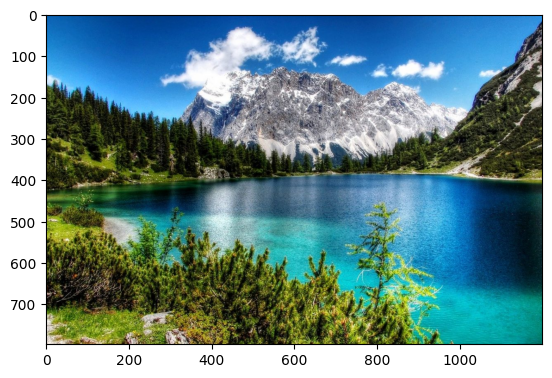

In [ ]:
img1 = mpimg.imread('data/image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [ ]:
img1.shape

(797, 1200, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

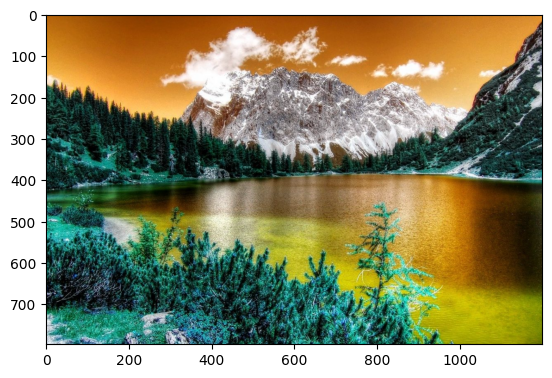

In [ ]:
img2 = cv2.imread('data/image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB).

Let's fix that

AxesImage(shape=(797, 1200, 3))


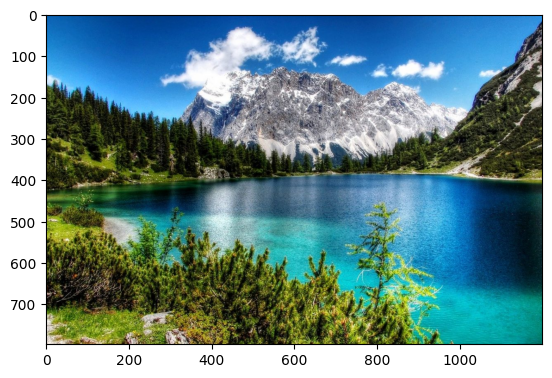

In [ ]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


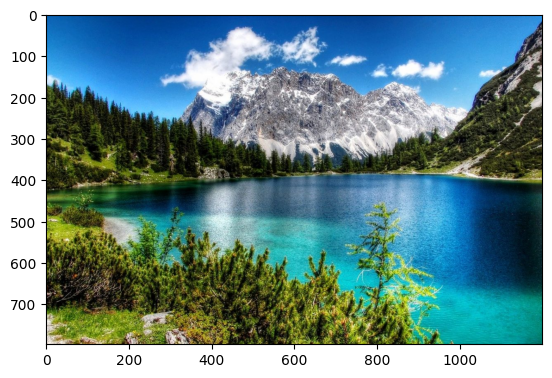

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [ ]:
img3 = np.array(img3)
img3.shape

(797, 1200, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

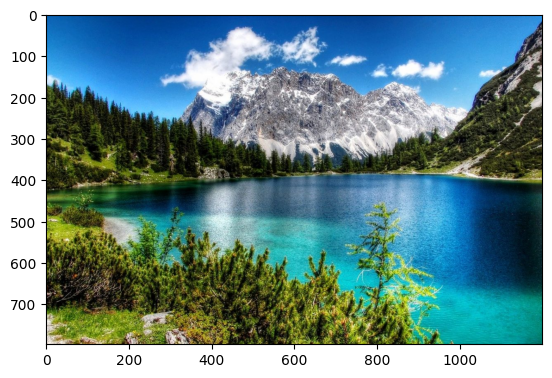

In [ ]:
# Save the image
np.save('data/img.npy', img3)

# Load the image
img3 = np.load('data/img.npy')

plt.imshow(img3)

## Resizing Images <a name="resize"></a>

One of the most common manipulations of an image is to resize it.

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 1200 x 797
New size: 200 x 200


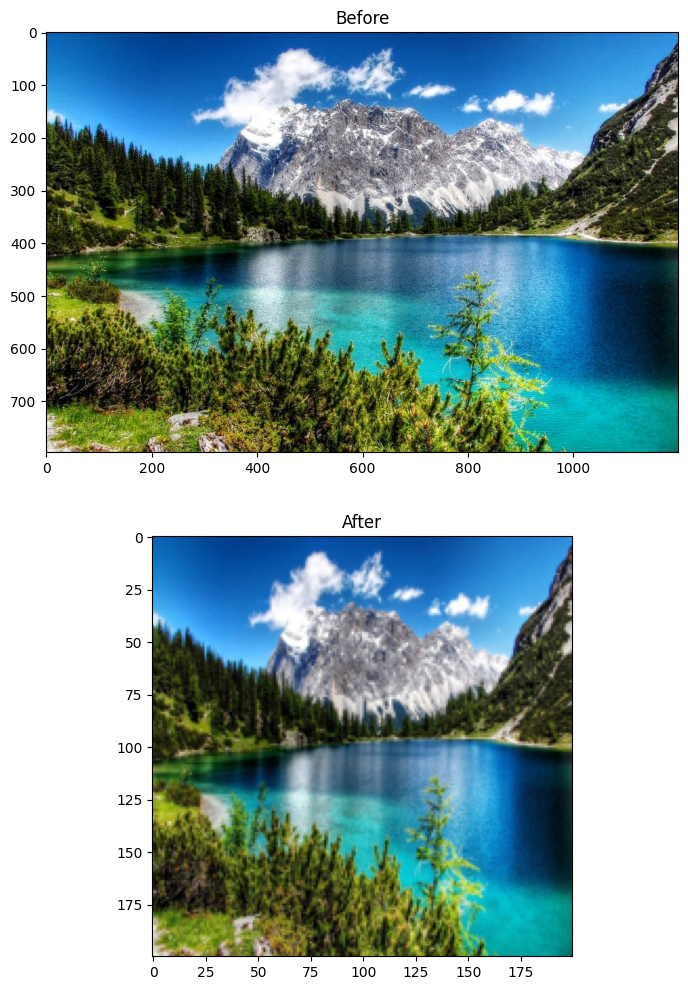

In [ ]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 797 x 1200
Scaled size: 133 x 200
New size: 200 x 200


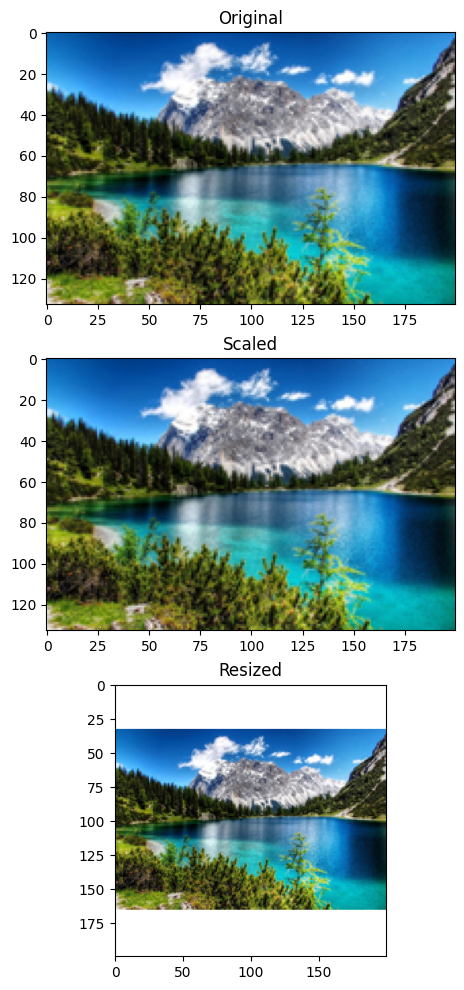

In [ ]:
# Get the image size
orig_width, orig_height = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.Resampling.LANCZOS)
scaled_width, scaled_height = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a name="negative"></a>


In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

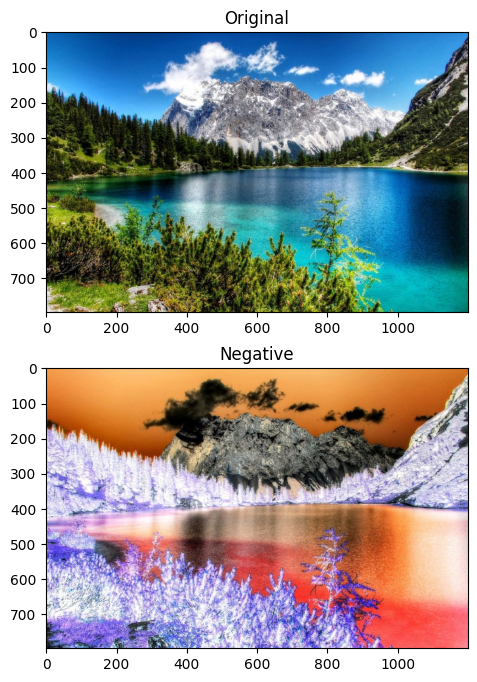

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a name="log"></a>


$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
#c = 255 / np.log(1 + np.max(orig_img))
#log_img = c * (np.log(orig_img + 1))

img_float = orig_img.astype(np.float32)
c = 255 / np.log(1 + np.max(img_float))
log_img = c * np.log(1 + img_float)

# Specify the data type so that
# float value will be converted to int
#log_img = np.array(log_img, dtype = np.uint8)

log_img = cv2.normalize(log_img, None, 0, 255, cv2.NORM_MINMAX)
log_img = np.uint8(log_img)

Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

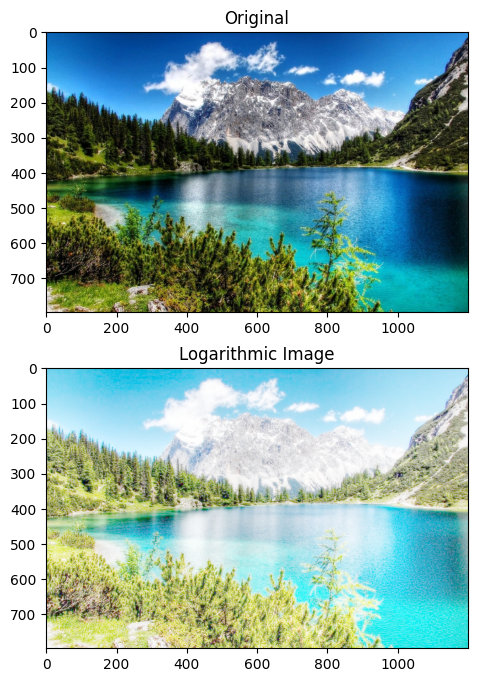

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a name="bin"></a>


Binarize pixels (set pixel values to 0 or 1) according to a threshold.

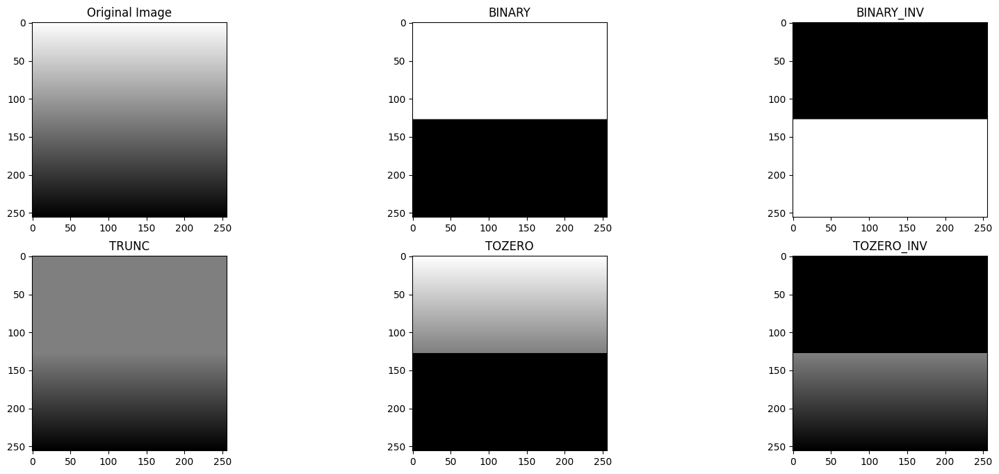

In [ ]:
orig_img = cv2.imread('data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer <a name="quant"></a>

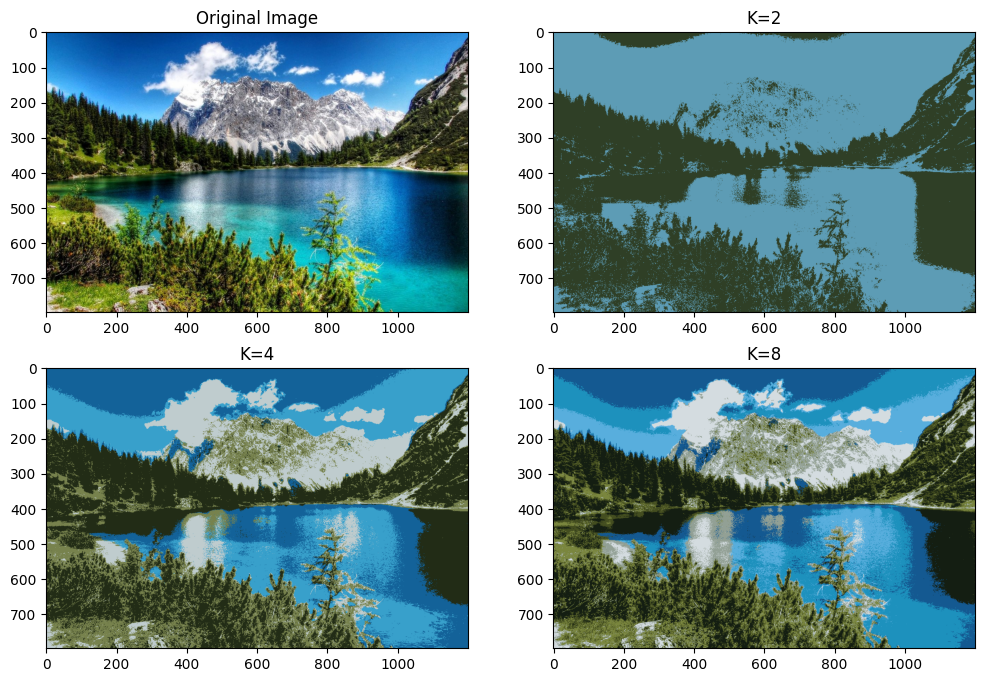

In [ ]:
orig_img = cv2.imread('data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

In [ ]:
def plot_images(img1, img2, title1="Image 1", title2="Image 2", figsize=(20,5)):
    """
    Muestra dos imágenes lado a lado usando matplotlib, haciendo más elegante la presentación en lineas posteriores.
    Args:
        img1: Primera imagen (formato BGR de OpenCV).
        img2: Segunda imagen (formato BGR de OpenCV).
        title1 (str): Título para la primera imagen.
        title2 (str): Título para la segunda imagen.
        figsize (tuple): Tamaño de la figura (ancho, alto).
    """

    plt.figure(figsize=figsize)

    # Primera imagen
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title(title1)
    plt.axis('off')

    # Segunda imagen
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title(title2)
    plt.axis('off')

    plt.show()

## Ejercicio #1 <a name="eje1"></a>
### Transformación Logarítmica  

La **transformación logarítmica** es una técnica de procesamiento de imágenes que ajusta los niveles de intensidad aplicando la función:  

$$
s = c \cdot \log(1 + r)
$$  

donde \(r\) es la intensidad de entrada, \(s\) la de salida y \(c\) una constante de escala.  
Esta operación **expande los valores bajos** (zonas oscuras) y **comprime los altos** (zonas brillantes). La transformación logarítmica es útil porque resalta detalles ocultos en sombras y comprime las zonas brillantes, mejorando la percepción visual sin alterar la estructura fundamental de la imagen.

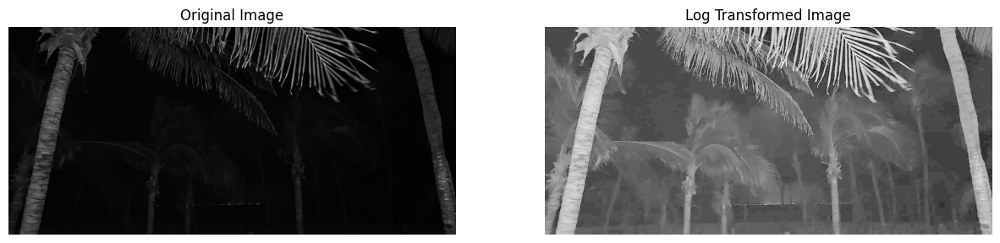

In [ ]:
img= 'data/img9.jpg'
# Cargar imagen y asegurar que sea de tipo flotante
orig_img = cv2.imread(img, 0)
img_float = cv2.imread(img, 0).astype(np.float32)

# Evitar log(0) añadiendo 1 y calcular la constante c
c = 255 / np.log(1 + np.max(img_float))
log_img = c * (np.log(img_float + 1))

# Convertir de nuevo a 8-bit para visualización
log_img = np.array(log_img, dtype=np.uint8)

plot_images(orig_img, log_img, "Original Image", "Log Transformed Image", (15,10))

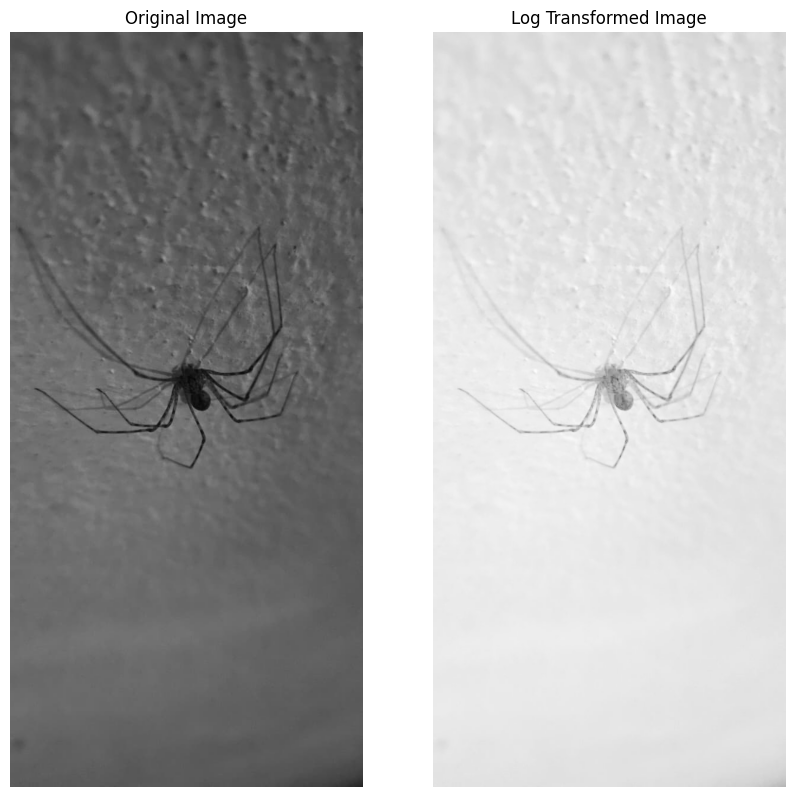

In [ ]:
img= 'data/img6.jpg'
orig_img = cv2.imread(img, 0)
img_float = cv2.imread(img, 0).astype(np.float32)

c = 255 / np.log(1 + np.max(img_float))
log_img = c * (np.log(img_float + 1))
log_img = np.array(log_img, dtype=np.uint8)

plot_images(orig_img, log_img, "Original Image", "Log Transformed Image", (10,20))

### Ecualización de Histogramas  

La **ecualización de histogramas** es una técnica de procesamiento de imágenes que ajusta los niveles de intensidad de manera que el histograma de salida sea lo más uniforme posible. El objetivo de este ejercicio es **mejorar automáticamente el contraste** de una imagen, expandiendo los niveles de intensidad en toda la escala disponible, ya que también es posible ecualizar cada uno de componentes (RGB)  resultando en cambios de tonalidad de colores.

El proceso consiste en calcular la función de distribución acumulada ($CDF$) del histograma de la imagen y usarla como función de transformación:  

$$
s = T(r) = (L - 1) \cdot \text{CDF}(r)
$$  

donde \($L$\) es el número total de niveles de intensidad (256 en imágenes de 8 bits).  

Se utiliza en aplicaciones médicas, satelitales y de visión por computadora para **resaltar detalles en imágenes con bajo contraste**.


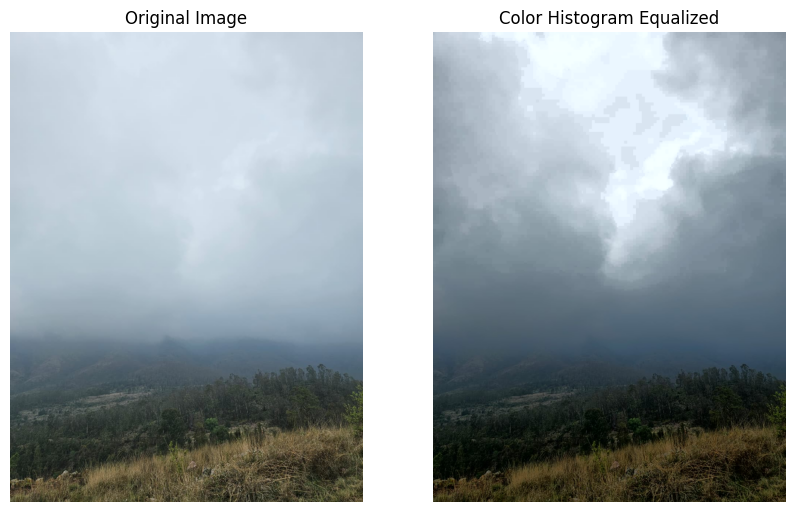

In [ ]:
orig_img = cv2.imread('data/img2.jpg')

# Convertimos a YCrCb
ycrcb_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2YCrCb)

# Separamos canales
y, cr, cb = cv2.split(ycrcb_img)

# Ecualizamos solo el canal de luminancia (Y)
y_eq = cv2.equalizeHist(y)

# Reconstruimos imagen
ycrcb_eq = cv2.merge([y_eq, cr, cb])
color_eq = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2BGR)

# Mostramos resultados
plot_images(orig_img, color_eq, "Original Image", "Color Histogram Equalized", (10,15))

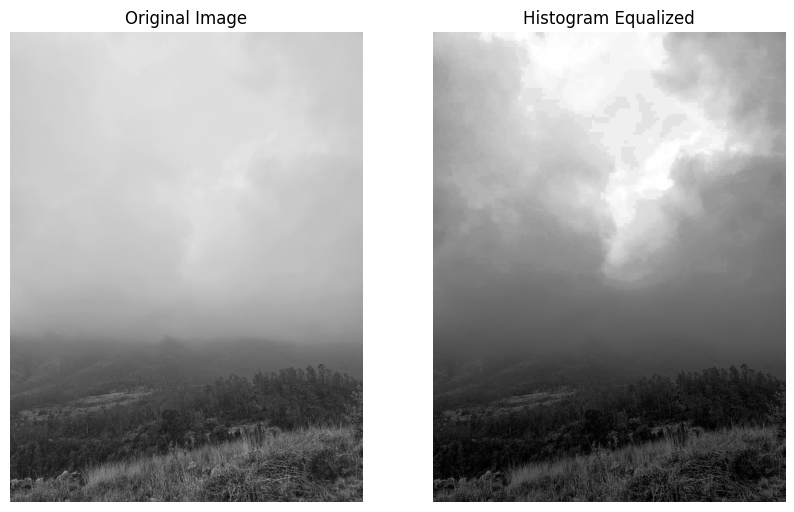

In [ ]:
#En escala de grises.
orig_img = cv2.imread('data/img2.jpg', 0)
equ = cv2.equalizeHist(orig_img)
plot_images(orig_img, equ, "Original Image", "Histogram Equalized", (10,15))

### Ajuste de Alpha ($\alpha$) y Beta ($\beta$) – Transformación Lineal  

El ajuste de **α (ganancia)** y **β (desplazamiento)** es una **transformación lineal de intensidad** que se aplica píxel por píxel y se define como:  

$$
s = \alpha \cdot r + \beta
$$  

donde:  
- \($r$\) es la intensidad del píxel de entrada.  
- \($\alpha$\) controla el **contraste** (α > 1 aumenta contraste, α < 1 lo disminuye).  
- \($\beta$\) controla el **brillo** (β > 0 aclara, β < 0 oscurece).  

Esta transformación es muy usada para **ajustar contraste y brillo simultáneamente** en imágenes digitales.  


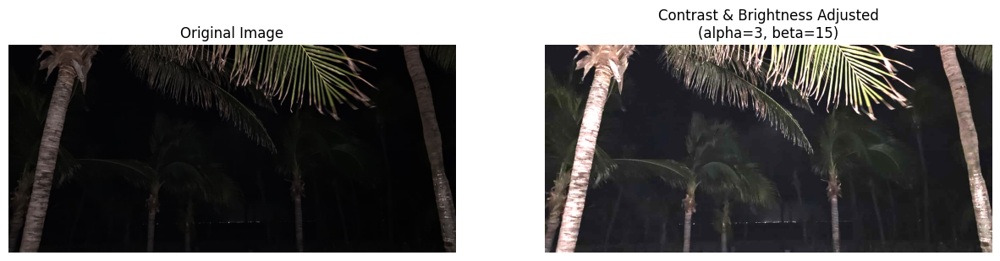

In [ ]:
orig_img = cv2.imread('data/img9.jpg')

alpha = 3  # Control de contraste (>1 aumenta el contraste, <1 lo reduce)
beta = 15  # Control de brillo (positivo = más brillante, negativo = más oscuro)

# Aplicamos ajuste de contraste y brillo
contrast_img = cv2.convertScaleAbs(orig_img, alpha=alpha, beta=beta)

plot_images(orig_img, contrast_img, "Original Image", f'Contrast & Brightness Adjusted\n(alpha={alpha}, beta={beta})', (15,10))

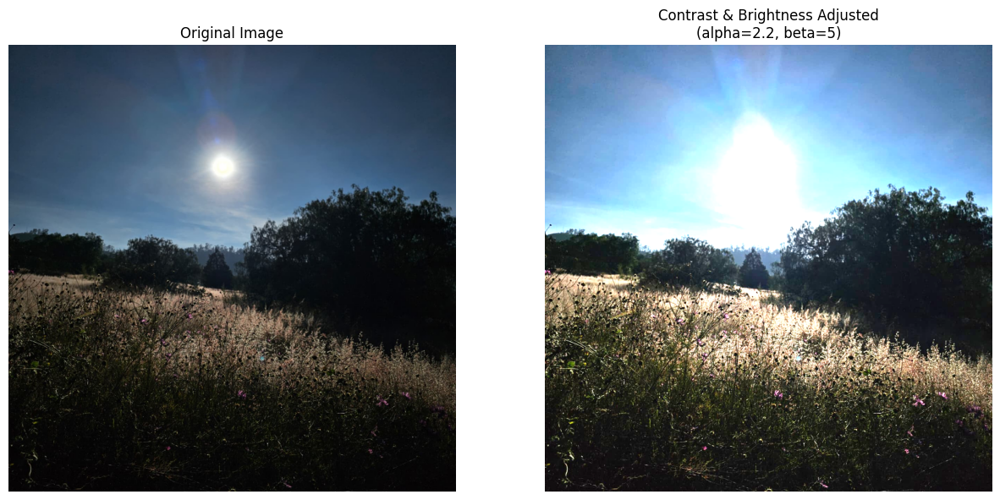

In [ ]:
orig_img = cv2.imread('data/img8.jpg')
alpha = 2.2
beta = 5
contrast_img = cv2.convertScaleAbs(orig_img, alpha=alpha, beta=beta)

plot_images(orig_img, contrast_img, "Original Image", f'Contrast & Brightness Adjusted\n(alpha={alpha}, beta={beta})', (15,10))

## Ejercicio #2 <a name="eje2"></a>
### Transformación Negativa en Imágenes  

Los **negativos de imagen** son una transformación de intensidad básica dentro del procesamiento digital. Se obtienen aplicando la función:  

$$
s = (L - 1) - r
$$  

donde \($r$\) es el nivel de intensidad de entrada y \($s$\) el de salida. Esta operación invierte los valores de intensidad de los píxeles, generando un **efecto similar al negativo fotográfico**.  

Su propósito principal es **resaltar detalles claros en zonas oscuras**, lo cual resulta útil en aplicaciones como la **mamografía digital**, donde ciertos observadores encuentran más fácil identificar estructuras en la imagen negativa.  

Este tipo de transformación se realiza **en el dominio espacial** actuando sobre cada píxel de manera individual, y es una técnica esencial en la manipulación de contraste y umbralización.  

**Descripcion:**

Una aplicacion donde conviene convertir una imagen en negativo es en radiologia. se usa el negativo porque al invertir los tonos claros y oscuros se hacen más visibles detalles pequeños que podrían pasar desapercibidos. Es una forma rápida y sencilla de mejorar el contraste para que el ojo humano detecte mejor las lesiones sin modificar la imagen original.

**Justificacion:**

Se usa el negativo porque al darle la vuelta a los colores de la imagen, ciertos detalles que antes casi no se veían saltan más a la vista, ayudando al médico a detectar cosas pequeñas que podrían pasar desapercibidas.


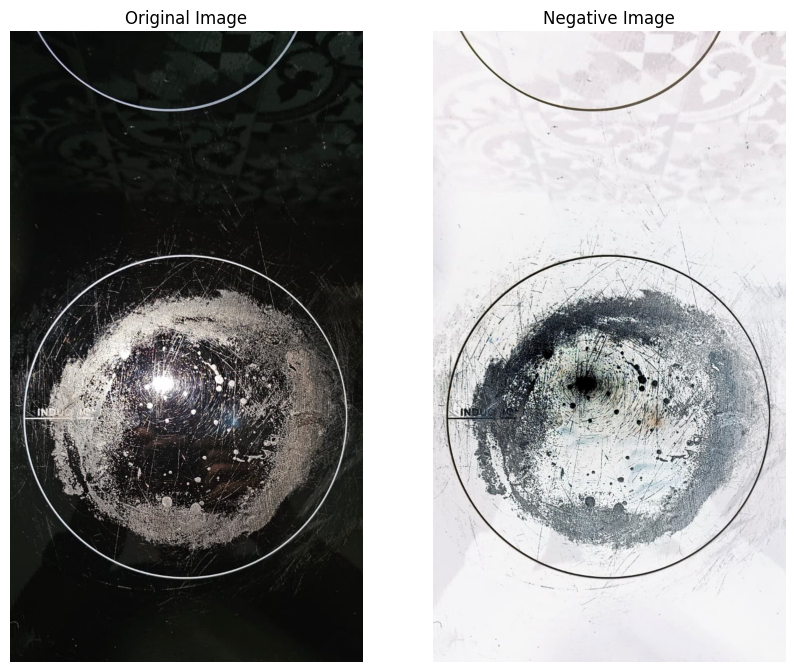

In [ ]:
#Negativos de Imagen
orig_img = cv2.imread('data/img10.jpg')

# Aplicamos transformación (invertir colores)
neg_img = cv2.bitwise_not(orig_img)

plot_images(orig_img, neg_img, "Original Image", "Negative Image", (10,20))

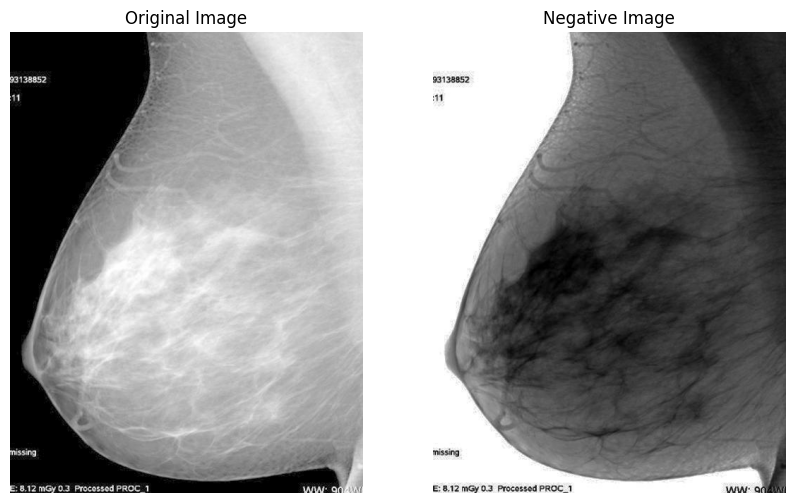

In [ ]:
orig_img = cv2.imread('data/photometric/Medical_X-Ray_breast_gamma.jpg')
neg_img = cv2.bitwise_not(orig_img)
plot_images(orig_img, neg_img, "Original Image", "Negative Image", (10,20))

## Ejercicio #3 <a name="eje3"></a>
### Transformación de Ley de Potencia (Corrección Gamma)  

La transformación de ley de potencia se define como:  

$$
s = c \cdot r^\gamma
$$  

donde \(c\) es una constante de escala y \(\gamma\) controla la intensidad:  
- \($\gamma$ < 1\): aclara las zonas oscuras.  
- \($\gamma$ > 1\): oscurece las zonas claras.  

Es fundamental en la **corrección gamma** de dispositivos de captura, impresión y visualización de imágenes.

**Descripción:**

La corrección gamma se utiliza para ajustar la luminosidad percibida de una imagen. Permite que fotos o imágenes que salieron demasiado oscuras o brillantes se vean más equilibradas y naturales. Ampliamente usada en fotografía digital y edición de imágenes, pantallas y monitores para compensar la respuesta no lineal del ojo humano.

**Justificación:**

Al aplicar la corrección gamma, se mejora la visibilidad de detalles sin alterar la información global de la imagen. Por ejemplo, zonas oscuras que contienen información importante pueden aclararse para que sean perceptibles, y zonas muy iluminadas pueden atenuarse. Esto ayuda a que la interpretación de la imagen sea más eficiente y agradable para el ojo humano.

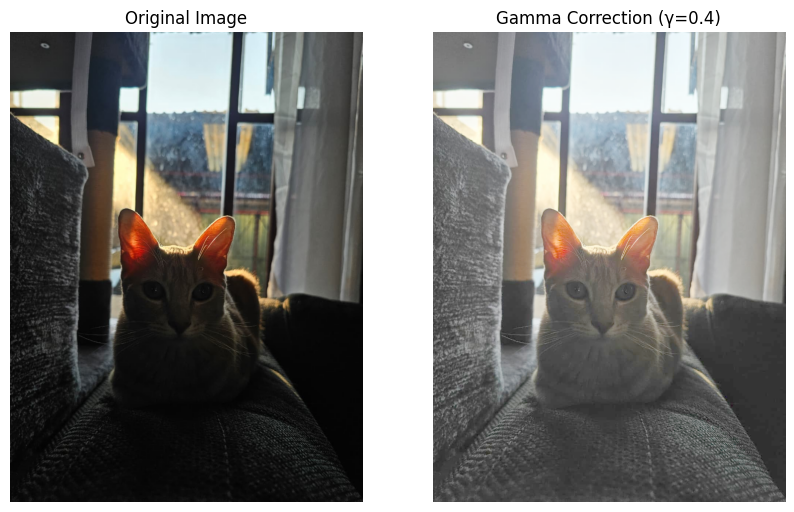

In [ ]:
# Ejemplo: Gamma Transformation
orig_img = cv2.imread('data/img4.jpg')

# Normalizamos valores [0,1]
normalized = orig_img / 255.0

gamma = 0.4  # < 1 aclara, > 1 oscurece
gamma_corrected = np.power(normalized, gamma)

# Volvemos al rango [0,255]
gamma_img = np.uint8(gamma_corrected * 255)

plot_images(orig_img, gamma_img, "Original Image", f"Gamma Correction (γ={gamma})", (10,10))


## Ejercicio #4 <a name="eje4"></a>  
### Sustracción de Imágenes (Detección de Movimiento y Realce de Bordes)  

La **sustracción de imágenes** es una operación que calcula la diferencia entre dos imágenes, permitiendo resaltar cambios o detalles importantes. Esta técnica tiene dos aplicaciones destacadas:  

1. **Detección de movimiento en vigilancia:**  
   - Se captura una imagen del fondo vacío y se resta la imagen actual.  
   - Solo se destacan los elementos que cambiaron, como personas o vehículos.  
   - Esto permite que los sistemas de seguridad enfoquen la atención en lo relevante, eliminando el fondo estático.  

2. **Realce de bordes mediante máscara de enfoque / highboost filtering:**  
   - Se genera una versión desenfocada de la imagen original y se resta de la original para obtener la **máscara**:  

   $$
   g_{\text{mask}}(x, y) = f(x, y) - f_{\text{blurred}}(x, y)
   $$  

   - La imagen final se obtiene sumando la máscara con un factor \(k\):  

   $$
   g(x, y) = f(x, y) + k \cdot g_{\text{mask}}(x, y)
   $$  

   - Permite enfatizar bordes y detalles finos, funcionando como un **filtro de paso alto**.  

**Justificación:**  
La sustracción de imágenes es útil tanto para detectar cambios importantes en escenas (como movimiento en vigilancia) como para mejorar la nitidez y resaltar bordes en procesamiento de imágenes, combinando eficiencia con claridad visual.  


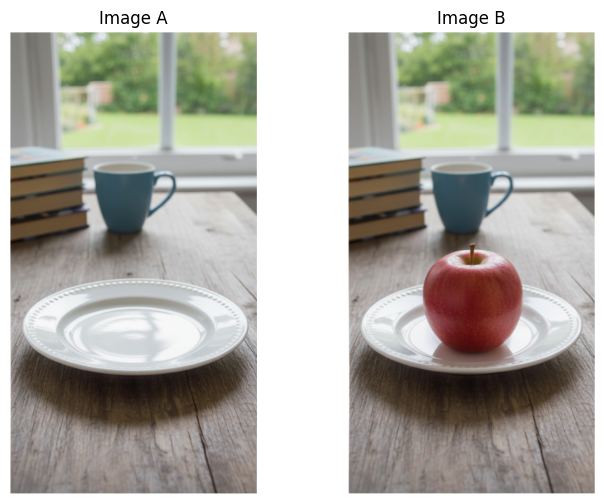

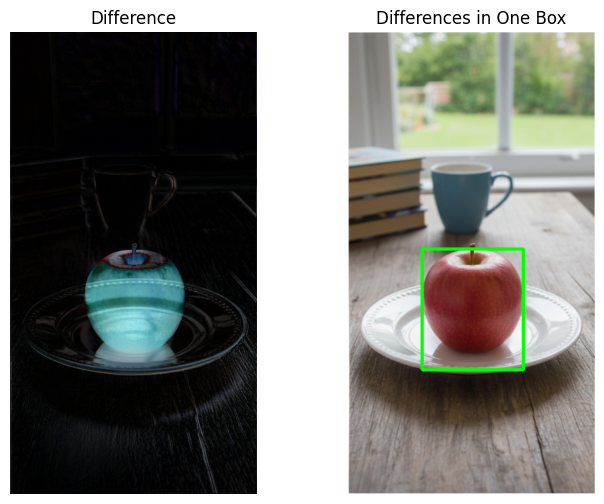

In [ ]:
imgA = cv2.imread('data/img_diff2.png')
imgB = cv2.imread('data/img_diff1.png')

if imgA is None or imgB is None:
    raise FileNotFoundError("Check the image paths!")

# Redimensionamos si es necesario para que ambas imágenes coincidan
if imgA.shape[:2] != imgB.shape[:2]:
    imgB = cv2.resize(imgB, (imgA.shape[1], imgA.shape[0]))

# --- Calcular diferencias ---
diff = cv2.absdiff(imgA, imgB)                      # color
diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)  # para umbral


# --- Umbral + limpiamos para obtener un solo recuadro grande ---
blur = cv2.GaussianBlur(diff_gray, (5, 5), 0)
_, mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
mask = cv2.morphologyEx(mask, cv2.MORPH_DILATE, kernel, iterations=2)

# --- Dibujamos un solo rectángulo que englobe todas las diferencias ---
vis = imgB.copy()
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if contours:
    x_min = min(cv2.boundingRect(c)[0] for c in contours)
    y_min = min(cv2.boundingRect(c)[1] for c in contours)
    x_max = max(cv2.boundingRect(c)[0] + cv2.boundingRect(c)[2] for c in contours)
    y_max = max(cv2.boundingRect(c)[1] + cv2.boundingRect(c)[3] for c in contours)
    cv2.rectangle(vis, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)
else:
    print("No differences found.")

# --- Ploteamos todo ---
plot_images(imgA, imgB, "Image A", "Image B", (8,6))
plot_images(diff, vis, "Difference", "Differences in One Box", (8,6))

## Conclusión <a name="Conclusion"></a>

A lo largo de estos ejercicios hemos explorado distintas transformaciones de imágenes y poco a poco entendimos de cómo algo tan sencillo como manipular píxeles puede cambiar por completo la información que vemos.

Al haber probado con ajustes de brillo, contraste, la transformación negativa, la ecualización de histograma y la corrección gamma, nos percatamos que no son solo filtros estéticos, sino formas de rescatar detalles que de otra manera pasarían desapercibidos. Algunos ejemplos como la transformación logarítmica nos ayudaron con imágenes de alto rango dinámico y el ajuste lineal con alpha y beta nos dio un control bastante fino sobre la intensidad.

Al final, sentimos que construimos una especie de caja de herramientas. Cada técnica tiene su lugar y, al combinarlas, no solo se mejora la calidad visual, sino que también se logra extraer información importante.

La ejecución de esta actividad nos permitió comprender que detrás de cada transformación hay una lógica que podemos aplicar según la necesidad de la imagen o del proyecto. No se trata solo de aplicar filtros al azar, sino de entender qué resultado buscamos y cómo cada técnica contribuye a ello.



## Referencias <a name="Referencias"></a>

1. Gonzalez, R. C., & Woods, R. E. (2018). *Intensity transformations and spatial filtering. En Digital image processing* (4th ed.). Pearson.
2. Singh, R. P., & Dixit, M. (2015). Histogram equalization: A strong technique for image enhancement. International Journal of Signal Processing, Image Processing and Pattern Recognition. https://doi.org/10.14257/ijsip.2015.8.8.35
3. Kang, B., Lee, S., & Paik, J. (2011). Adaptive height-modified histogram equalization and chroma correction in YCbCr color space for fast backlight image compensation. IEEE Transactions on Consumer Electronics, 57(1), 380–387.
4. GeeksforGeeks. (s.f.). Intensity Transformation Operations on Images. GeeksforGeeks. Recuperado de https://www.geeksforgeeks.org/python-intensity-transformation-operations-on-images/
5. SpMallick, S. (s.f.). Simple Background Estimation in Videos using OpenCV (C++/Python). LearnOpenCV. https://learnopencv.com/simple-background-estimation-in-videos-using-opencv-c-python/
6. Schnabel, M. (2019). opencv-motion-detector: A Python/OpenCV script that uses background subtraction to detect motion in a live feed or video. GitHub. https://github.com/markschnabel/opencv-motion-detector

